# Calibrated Explanations
## Comparison with LIME

Author: Tuwe Löfström (tuwe.lofstrom@ju.se)  
Copyright 2023 Tuwe Löfström  
License: BSD 3 clause
Sources:
1. [Wine Quality [uci]](https://archive.ics.uci.edu/ml/datasets/wine+quality)
2. [California Housing data set [kaggle]](https://www.kaggle.com/datasets/camnugent/california-housing-prices)

In [15]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
import numpy as np
import pandas as pd

from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import fetch_openml

from lime.lime_tabular import LimeTabularExplainer

from calibrated_explanations import CalibratedExplainer,  __version__

from crepes import ConformalPredictiveSystem
from crepes.extras import DifficultyEstimator

print(f"calibrated_explanations {__version__}")

calibrated_explanations v0.2.3


# Classification

In [17]:
dataset = fetch_openml(name="wine", version=7, as_frame=True)

X = dataset.data.values.astype(float)
y = (dataset.target.values == 'True').astype(int)

feature_names = dataset.feature_names

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=2, stratify=y)

X_prop_train, X_cal, y_prop_train, y_cal = train_test_split(X_train, y_train,
                                                            test_size=0.25)

In [18]:
rf = RandomForestClassifier(n_jobs=-1)

rf.fit(X_prop_train, y_prop_train)

RandomForestClassifier(n_jobs=-1)

In [19]:
cal_expl = CalibratedExplainer(rf, 
                        X_cal, 
                        y_cal, 
                        feature_names=feature_names, 
                        mode='classification')  
display(cal_expl)

CalibratedExplainer:
	                mode=classification
	                discretizer=<class 'NoneType'>
	                model=RandomForestClassifier(n_jobs=-1)
	                

In [20]:
factual_explanations_cl = cal_expl.explain_factual(X_test)
ce_as_lime_cl = factual_explanations_cl.as_lime()

In [21]:
lime_expl = LimeTabularExplainer(X_cal, feature_names=feature_names)
lime_exps_cl = []
for instance in X_test:
    exp = lime_expl.explain_instance(instance, rf.predict_proba)
    lime_exps_cl.append(exp)

Instance 0: LIME Explanation


Instance 0: Calibrated Explanation


Instance 1: LIME Explanation


Instance 1: Calibrated Explanation


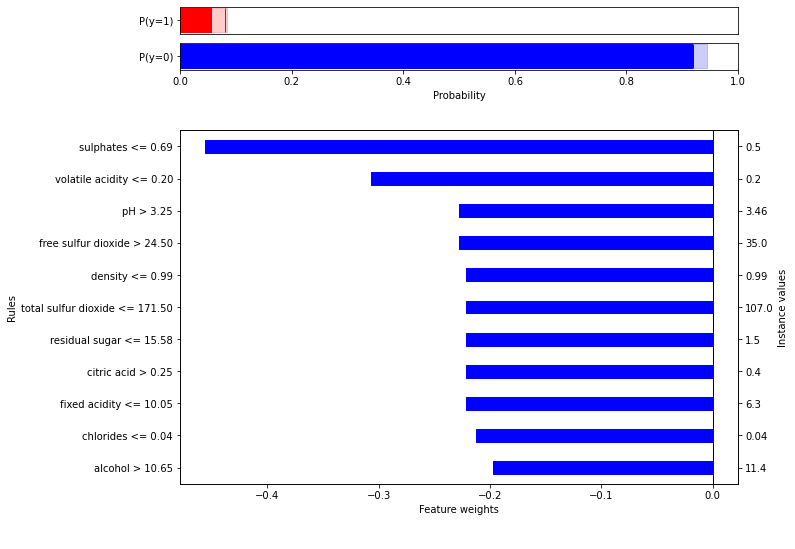

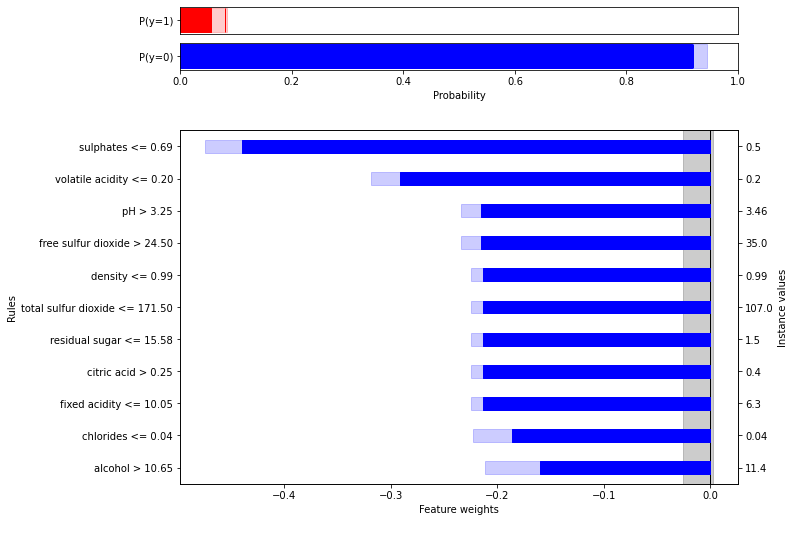

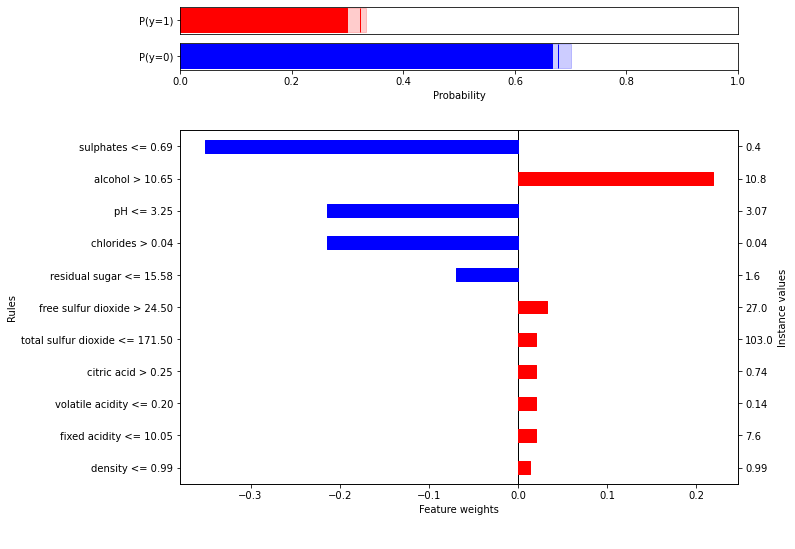

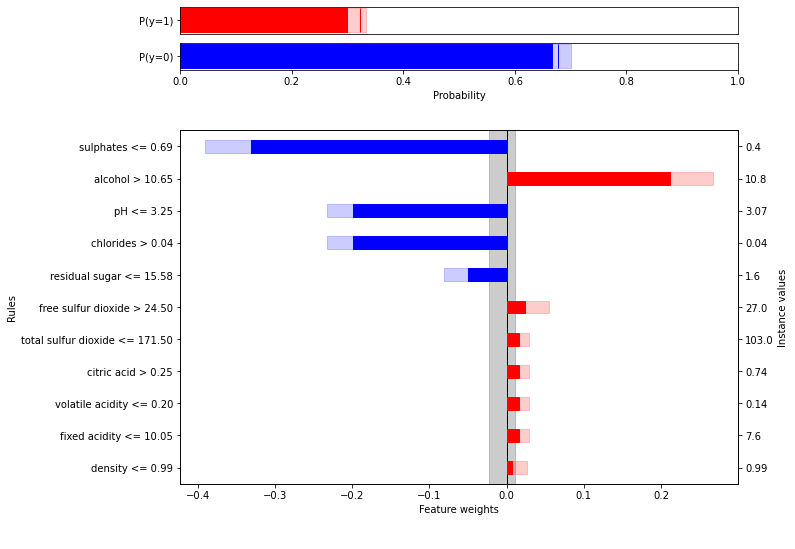

In [22]:
for i, (ce, lime) in enumerate(zip(ce_as_lime_cl, lime_exps_cl)):
    print(f'Instance {i}: LIME Explanation')
    lime.show_in_notebook(show_table=True)
    print(f'Instance {i}: Calibrated Explanation')
    factual_explanations_cl.get_explanation(i).plot_explanation()
    factual_explanations_cl.get_explanation(i).plot_explanation(uncertainty=True)
    ce.show_in_notebook(show_table=True)

# Regression

In [23]:
dataset = fetch_openml(name="house_sales", version=3)

X = dataset.data.values.astype(float)
y = dataset.target.values
filter_idx = y <= 500000
X = X[filter_idx,:]
y = y[filter_idx]
y = y / 1000

feature_names = dataset.feature_names

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=2, random_state=42)

X_prop_train, X_cal, y_prop_train, y_cal = train_test_split(X_train, y_train,
                                                            test_size=0.25)

Let us split the data set into a training and a test set, and further split the training set into a proper training set and a calibration set. Let us fit a random forest to the proper training set. We also set a random seed to be able to rerun the notebook and get the same results.

In [24]:
rf = RandomForestRegressor(n_estimators=100, oob_score=True)

rf.fit(X_prop_train, y_prop_train)  

RandomForestRegressor(oob_score=True)

In [25]:
cal_expl = CalibratedExplainer(rf, 
                        X_cal, 
                        y_cal, 
                        feature_names=feature_names, 
                        mode='regression')  
display(cal_expl)

CalibratedExplainer:
	                mode=regression
	                discretizer=<class 'NoneType'>
	                model=RandomForestRegressor(oob_score=True)
	                difficulty_estimator=None

In [26]:
factual_explanations_reg = cal_expl.explain_factual(X_test, low_high_percentiles=(5,95))
ce_as_lime_reg = factual_explanations_reg.as_lime(num_features_to_show=10)

In [27]:
lime_expl = LimeTabularExplainer(X_cal, feature_names=feature_names, mode='regression')
lime_exps_reg = []
for instance in X_test:
    exp = lime_expl.explain_instance(instance, rf.predict)
    lime_exps_reg.append(exp)

Instance 0: LIME Explanation


Instance 0: Calibrated Explanation


Instance 1: LIME Explanation


Instance 1: Calibrated Explanation


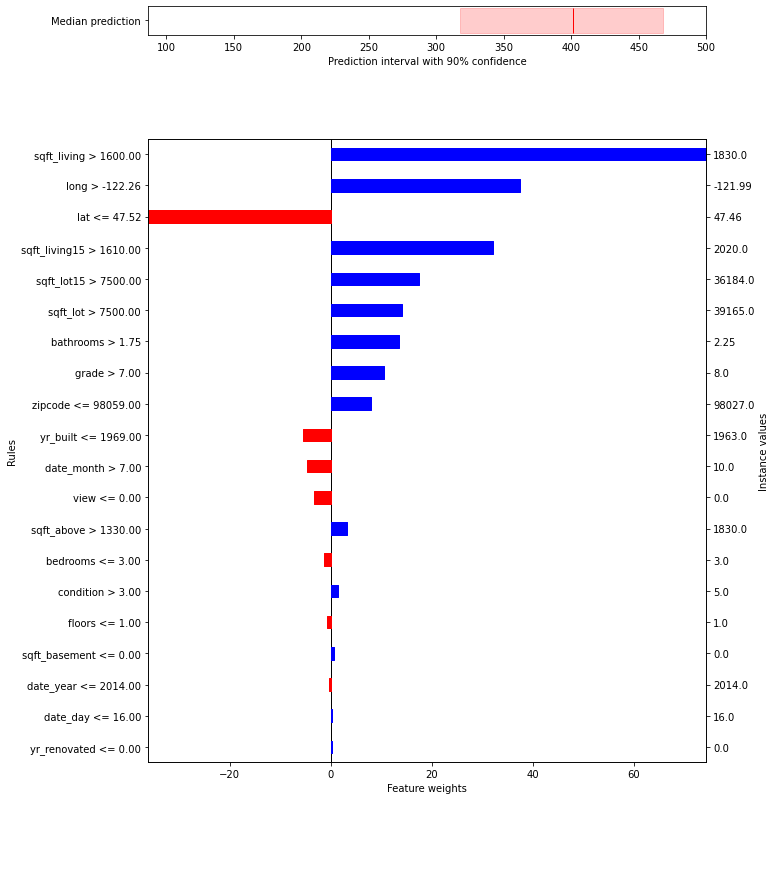

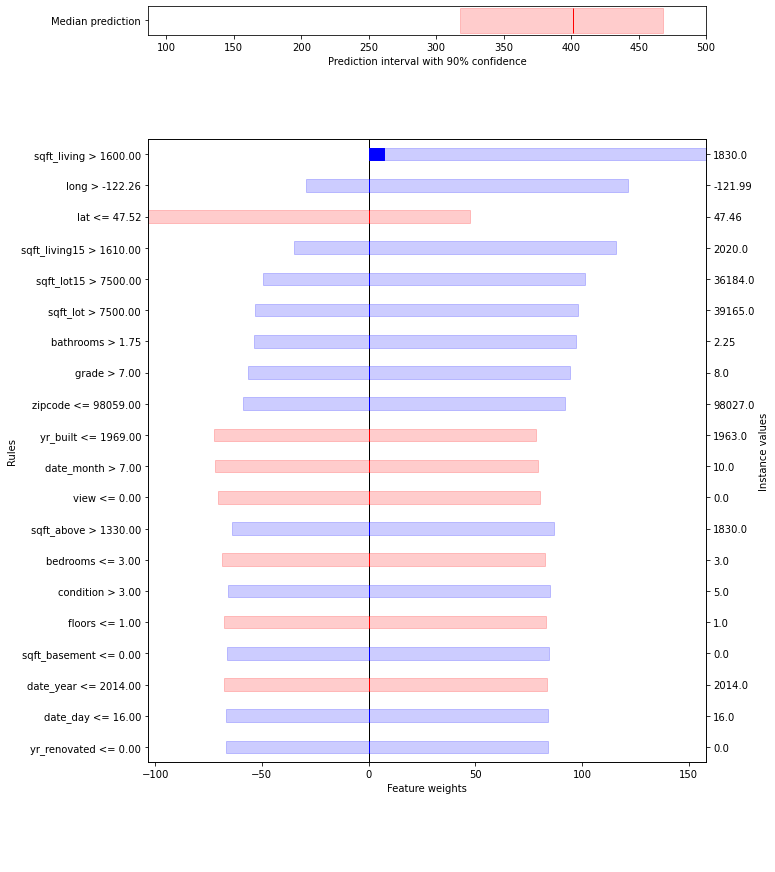

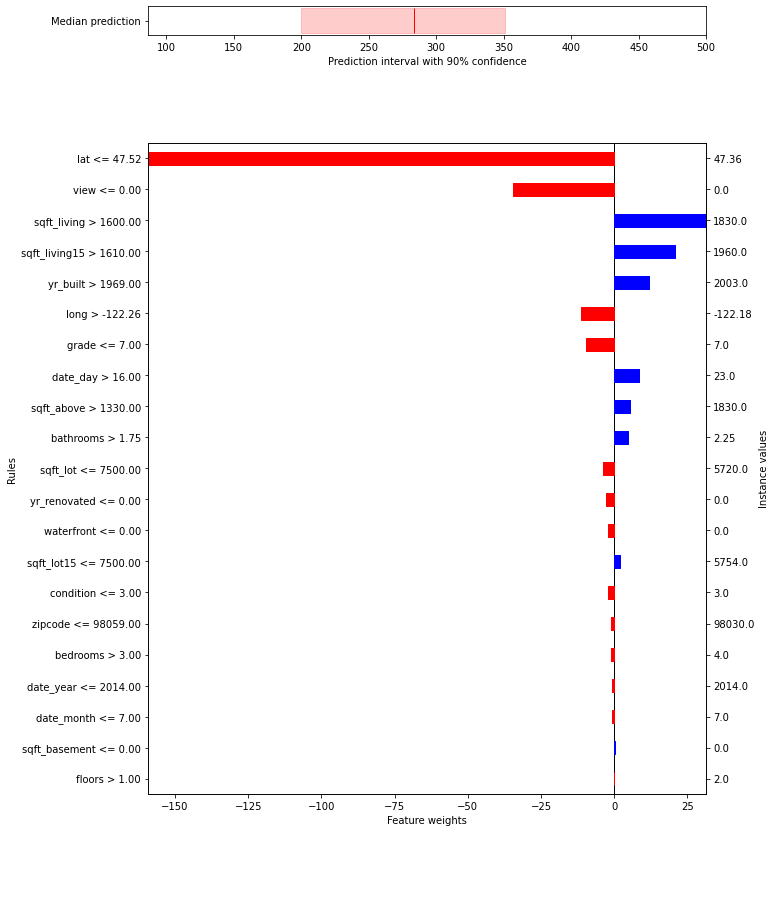

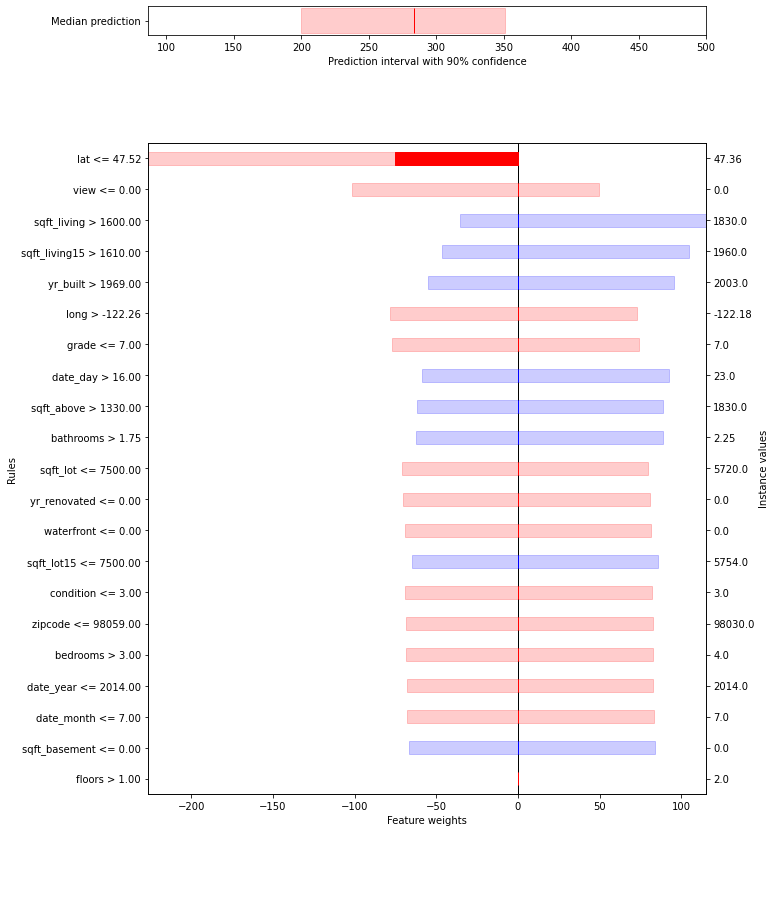

In [28]:
for i, (ce, lime) in enumerate(zip(ce_as_lime_reg, lime_exps_reg)):
    print(f'Instance {i}: LIME Explanation')
    lime.show_in_notebook(show_table=True)
    print(f'Instance {i}: Calibrated Explanation')
    factual_explanations_reg.get_explanation(i).plot_explanation()
    factual_explanations_reg.get_explanation(i).plot_explanation(uncertainty=True)
    ce.show_in_notebook(show_table=True)